# Healthcare Fraud --- II Models 

# Objectives
This notebook will conduct an analysis of the Fraud, Waste, and Abuse of Medical resources. I will focus on detecting any hospital that may abuse the resources compared to its peers of the same features, location, or each diagnosis group.

# Dataset
The dataset is from the Medicare Inpatient Hospitals by Geography and service that provides information on hospital discharges. Please see more information in "Healthcare Fraud --- I EDA&Feature Engineering".

# Models
I will perform various techniques to identify fraud in the healthcare industry and follow modeling procedures for the model development, assessment, and interpretation of the results. 
* Model development
* Threshold determination
* Descriptive statistics of the normal and abnormal groups

Python Outlier Detection (PyOD) module includes many supervised and unsupervised algorithms to detect anomalies. I will apply Autoencoders in this notebook.

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Data-Preparation-" data-toc-modified-id="Data-Preparation--1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Data Preparation <a class="anchor" id="Section_1" rel="nofollow"></a></a></span></li><li><span><a href="#Feature-Selection" data-toc-modified-id="Feature-Selection-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Feature Selection</a></span></li><li><span><a href="#Models---Autoencoders-in-the-PyOD-module" data-toc-modified-id="Models---Autoencoders-in-the-PyOD-module-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Models - Autoencoders in the PyOD module</a></span><ul class="toc-item"><li><span><a href="#Overview" data-toc-modified-id="Overview-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Overview</a></span></li><li><span><a href="#Modeling" data-toc-modified-id="Modeling-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Modeling</a></span><ul class="toc-item"><li><span><a href="#Model-development" data-toc-modified-id="Model-development-3.2.1"><span class="toc-item-num">3.2.1&nbsp;&nbsp;</span>Model development</a></span></li><li><span><a href="#Threshold-determination" data-toc-modified-id="Threshold-determination-3.2.2"><span class="toc-item-num">3.2.2&nbsp;&nbsp;</span>Threshold determination</a></span></li><li><span><a href="#Descriptive-statistics-of-the-normal-and-abnormal-groups" data-toc-modified-id="Descriptive-statistics-of-the-normal-and-abnormal-groups-3.2.3"><span class="toc-item-num">3.2.3&nbsp;&nbsp;</span>Descriptive statistics of the normal and abnormal groups</a></span></li></ul></li><li><span><a href="#Modeling---Aggregate-to-Achieve-Model-Stability" data-toc-modified-id="Modeling---Aggregate-to-Achieve-Model-Stability-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Modeling - Aggregate to Achieve Model Stability</a></span><ul class="toc-item"><li><span><a href="#Average" data-toc-modified-id="Average-3.3.1"><span class="toc-item-num">3.3.1&nbsp;&nbsp;</span>Average</a></span></li></ul></li></ul></li></ul></div>

In [1]:
#from IPython.core.interactiveshell import InteractiveShell
#InteractiveShell.ast_node_interactivity = "all"

#pd.options.display.float_forma
t = '{:.2f}'.format

## Data Preparation <a class="anchor" id="Section_1"></a>
Dataset is prepared from last module. 

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from pyod.models.auto_encoder import AutoEncoder
from pyod.models.combination import aom, moa, average, maximization
from sklearn.preprocessing import StandardScaler
from pyod.utils.utility import standardizer

2022-11-04 22:31:51.295297: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
#Loading Data
path = '/Users/Edwina/Desktop/2022fall/5420/week6'
df = pd.read_csv(path + '/data_healthcare.csv')

In [4]:
#df.describe()
#df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 163065 entries, 0 to 163064
Data columns (total 42 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   Unnamed: 0                        163065 non-null  int64  
 1   DRG                               163065 non-null  object 
 2   Provider_Id                       163065 non-null  int64  
 3   Provider_Name                     163065 non-null  object 
 4   Provider_StreetAddress            163065 non-null  object 
 5   Provider_City                     163065 non-null  object 
 6   Provider_State                    163065 non-null  object 
 7   Provider_Zipcode                  163065 non-null  int64  
 8   Hospital_referral_region_desp     163065 non-null  object 
 9   Total_Discharges                  163065 non-null  int64  
 10  Average_Total_Payments            163065 non-null  float64
 11  Average_Medicare_Payment          163065 non-null  f

In [5]:
df.head(3)

,Unnamed: 0,DRG,Provider_Id,Provider_Name,Provider_StreetAddress,Provider_City,Provider_State,Provider_Zipcode,Hospital_referral_region_desp,Total_Discharges,...,ratio_MP_DRG_bin,AvgMedicarePayment_By_State_DRG,ratio_MP_State_DRG,ratio_MP_State_DRG_bin,AvgMedicarePayment_By_Region_DRG,ratio_MP_Region_DRG,ratio_MP_Region_DRG_bin,MTotalPayment_By_City,ratio_MTP_City_DRG,ratio_MTP_City_DRG_bin
0,0,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,AL - Dothan,91,...,"(0.802, 0.917]",4585.965000,1.038763,"(0.977, 1.093]",4585.965000,1.038763,"(0.977, 1.093]",8316.949825,0.694634,"(0.534, 0.774]"
1,1,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10005,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,AL - Birmingham,14,...,"(0.802, 0.917]",4604.024615,1.080948,"(0.977, 1.093]",4604.024615,1.080948,"(0.977, 1.093]",6812.131224,0.849598,"(0.774, 1.305]"
2,2,039 - EXTRACRANIAL PROCEDURES W/O CC/MCC,10006,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631,AL - Birmingham,24,...,"(0.723, 0.802]",4604.024615,0.967369,"(0.873, 0.977]",4604.024615,0.967369,"(0.873, 0.977]",8881.752832,0.611923,"(0.534, 0.774]"


## Feature Selection

In [6]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
newdf = df.select_dtypes(include=numerics)
#newdf.drop('Provider_Zipcode')
newdf = newdf.drop('Provider_Zipcode', axis=1)
newdf.shape

(163065, 25)

In [7]:
#X_train = newdf.copy()
features=['ratio_TP_DRG',
       'ratio_TP_State_DRG',
       'ratio_TP_Region_DRG',
       'ratio_D_DRG', 
       'ratio_D_States_DRG', 
       'ratio_D_Region_DRG',  'ratio_MP_DRG',
        'ratio_MP_State_DRG',
        'ratio_MP_Region_DRG',
        'ratio_MTP_City_DRG']
X_train = df[features]
#X_train = X_train[features]
X_train.head()

,ratio_TP_DRG,ratio_TP_State_DRG,ratio_TP_Region_DRG,ratio_D_DRG,ratio_D_States_DRG,ratio_D_Region_DRG,ratio_MP_DRG,ratio_MP_State_DRG,ratio_MP_Region_DRG,ratio_MTP_City_DRG
0,0.830000,1.005855,1.037810,2.921770,1.338235,1.338235,0.857428,1.038763,1.038763,0.694634
1,0.831484,1.007653,1.008540,0.449503,0.509804,0.509804,0.895762,1.080948,1.080948,0.849598
2,0.780824,0.946260,0.947092,0.770577,0.873950,0.873950,0.801642,0.967369,0.967369,0.611923
3,0.778325,0.943232,0.944062,0.802684,0.910364,0.910364,0.743211,0.896859,0.896859,0.593905
4,0.812916,0.985152,0.986018,0.577933,0.655462,0.655462,0.873215,1.053739,1.053739,0.726413


<AxesSubplot:>

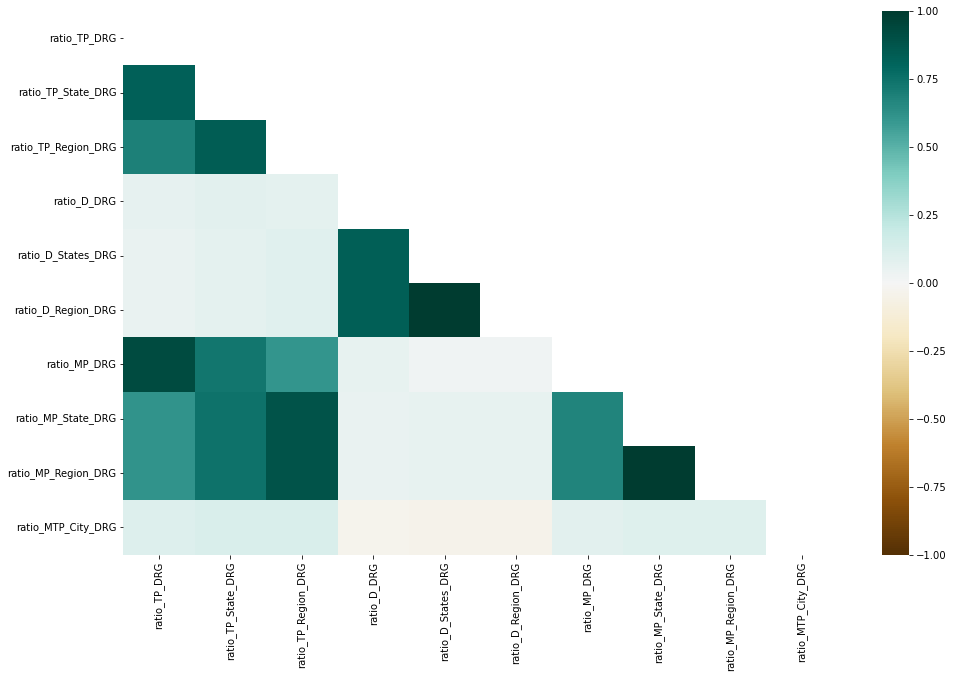

In [8]:
correlation = X_train.corr()
f, ax = plt.subplots(figsize=(16, 10))
mask = np.triu(np.ones_like(correlation, dtype=bool)) #mask for upper triangle
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(correlation, mask = mask,vmin=-1, vmax=1,
            cmap = 'BrBG',
            #annot=True
           )

## Models - Autoencoders in the PyOD module

### Overview
Autoencoders are neural-network-based algorithms. It is one type of unsupervised Neural Networks or Deep Learning. It extracts the essential information of the input values and ignore the “noises” by hidden layers and then reconstruct the data back. These two process are called encoding and decoding. The number of neurons in the hidden layers should less than those of the input layer and the output layer. If no, it doesn't learn the data with extracting any essential information and includes noises. 

The most important features of autoencoders are non-linear transformations with their non-linear activation function and multiple layers. Another type of Dimensionality Reduction is PCA, which only perform linear transformations. This method is fast and suitable when working with complex and non-linear problems. It is more efficient to train several layers with an autoencoder, rather than training one huge transformation with PCA.

### Modeling

#### Model development
The first model will use 5% contamination rate and 2x2 hidden neurons (two hidden layers and each hidden layer has two neurons) to construct model. It does not affect the calculation of the outlier scores and uses it to derive the threshold for the outlier scores.

In [9]:
atcdr = AutoEncoder(contamination=0.05, hidden_neurons =[2, 2], epochs =10)
atcdr.fit(X_train)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 10)                110       
                                                                 
 dropout (Dropout)           (None, 10)                0         
                                                                 
 dense_1 (Dense)             (None, 10)                110       
                                                                 
 dropout_1 (Dropout)         (None, 10)                0         
                                                                 
 dense_2 (Dense)             (None, 2)                 22        
                                                                 


2022-11-04 22:32:04.457524: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


 dropout_2 (Dropout)         (None, 2)                 0         
                                                                 
 dense_3 (Dense)             (None, 2)                 6         
                                                                 
 dropout_3 (Dropout)         (None, 2)                 0         
                                                                 
 dense_4 (Dense)             (None, 10)                30        
                                                                 
Total params: 278
Trainable params: 278
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/10
4587/4587 [==============================] - 14s 3ms/step - loss: 1.1266 - val_loss: 1.0047
Epoch 2/10
4587/4587 [==============================] - 12s 3ms/step - loss: 1.0066 - val_loss: 0.9916
Epoch 3/10
4587/4587 [==============================] - 7s 2ms/step - loss: 1.0020 - val_loss: 0.9901
Epoch 4/10
4587/4587 [=======

AutoEncoder(batch_size=32, contamination=0.05, dropout_rate=0.2, epochs=10,
      hidden_activation='relu', hidden_neurons=[2, 2], l2_regularizer=0.1,
      loss=<function mean_squared_error at 0x7fce4494d160>,
      optimizer='adam', output_activation='sigmoid', preprocessing=True,
      random_state=None, validation_size=0.1, verbose=1)

The above table displays the structure of the autoencoder model: the type of a layer, the shape of a layer, and the number of parameters. The straightforward neural network model has the input layer, the two hidden layers, and the output layer. So the repeating structure “dense_1 + dropout_1”, “dense_2 + dropout_2”, “dense_3 + dropout_3”, “dense_4” represent the four layers. The shape of the input layer is 10, and the trained parameters are 278. 

In [10]:
# show the funcation's parameters. 
atcdr.get_params()

{'batch_size': 32,
 'contamination': 0.05,
 'dropout_rate': 0.2,
 'epochs': 10,
 'hidden_activation': 'relu',
 'hidden_neurons': [2, 2],
 'l2_regularizer': 0.1,
 'loss': <function keras.losses.mean_squared_error(y_true, y_pred)>,
 'optimizer': 'adam',
 'output_activation': 'sigmoid',
 'preprocessing': True,
 'random_state': None,
 'validation_size': 0.1,
 'verbose': 1}

In [11]:
# atcdr.decision_function: Predict raw anomaly score of X using the fitted detector.
y_train_scores = atcdr.decision_function(X_train)
y_train_pred = atcdr.predict(X_train)

# Threshold for the defined comtanimation rate
print("The threshold for the defined contamination rate:", atcdr.threshold_)

# count the number of normal and outliers
def count_stat(vector):
    # Because it is '0' and '1', we can run a count statistic.
    unique, counts = np.unique(vector, return_counts=True)
    return dict(zip(unique, counts))


print("The training data:", count_stat(y_train_pred))

5096/5096 [==============================] - 6s 1ms/step
The threshold for the defined contamination rate: 5.919457261032598
The training data: {0: 154911, 1: 8154}


After declaring and fitting the model, I generated the outlier scores for the training data. It also shows the threshold at the assigned contamination rate. Any outlier score higher than the threshold is considered an outlier.

#### Threshold determination

* Method 1

Plotting the distribution of train scores

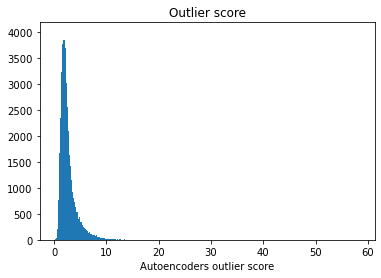

In [12]:
plt.hist(y_train_scores, bins='auto')  # arguments are passed to np.histogram
plt.title("Outlier score")
plt.xlabel('Autoencoders outlier score')
plt.show()

The above chart displays the histogram of the Autoencoders outlier score. We can see that it has a long tail on the right side. Right-skewed Distribution has the mean to the right of the median.

* Method 2

In statistics, the upper and lower fences represent the cut-off values for upper and lower outliers in a dataset. Since we don't have any prior knowledge on the percentage of anomalies, we use upper fences to select a reasonable threshold value. An extreme value that lies outside the lower or upper whiskers is designated an “Outlier”.

In [13]:
#plot statistics of anomaly score
fig = px.box(y_train_scores, width=600, height=400)
fig.show()

The boxplot shows the upper fence is 5.16. Scores above it, are far from the central part of the distribution, could be considered outliers and need to be further investigated. 

Score's upper fence is:  5.165172675368053


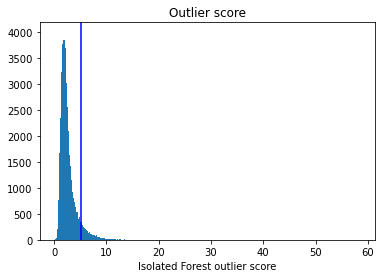

In [14]:
#get upper fence value
def uppervalue(data):
    Q3 = np.quantile(data, 0.75)
    Q1 = np.quantile(data, 0.25)
    IQR = Q3 - Q1
    upper_value = Q3 + 1.5 * IQR

    print("Score's upper fence is: ", upper_value)
    return upper_value

#plot the distribution with upper fence
def plotupper(data, line):
    plt.hist(data, bins='auto')  # arguments are passed to np.histogram
    plt.title("Outlier score")
    plt.xlabel('Isolated Forest outlier score')
    plt.axvline(x=line, color='b', label='thredhold')
    plt.show()

threshold_upper = uppervalue(y_train_scores)
plotupper(y_train_scores, threshold_upper)

The chart displays the distribution of train scores with upper fence. 

#### Descriptive statistics of the normal and abnormal groups

In [15]:
#threshold = thredhold_upper #atcdr.threshold_  # Or other value from the above histogram


def descriptive_stat_threshold(df, pred_score, threshold):
    # Let's see how many '0's and '1's.
    df = pd.DataFrame(df)
    df['Anomaly_Score'] = pred_score
    df['Group'] = np.where(df['Anomaly_Score'] < threshold, 'Normal',
                           'Outlier')

    # Now let's show the summary statistics:
    cnt = df.groupby('Group')['Anomaly_Score'].count().reset_index().rename(
        columns={'Anomaly_Score': 'Count'})
    cnt['Count %'] = (cnt['Count'] /
                      cnt['Count'].sum()) * 100  # The count and count %
    stat = df.groupby('Group').mean().round(2).reset_index()  # The avg.
    stat = cnt.merge(stat, left_on='Group',
                     right_on='Group')  # Put the count and the avg. together
    return (stat)


descriptive_stat_threshold(X_train, y_train_scores, threshold_upper)

,Group,Count,Count %,ratio_TP_DRG,ratio_TP_State_DRG,ratio_TP_Region_DRG,ratio_D_DRG,ratio_D_States_DRG,ratio_D_Region_DRG,ratio_MP_DRG,ratio_MP_State_DRG,ratio_MP_Region_DRG,ratio_MTP_City_DRG,Anomaly_Score
0,Normal,151067,92.642198,0.96,0.97,0.98,0.94,0.95,0.95,0.96,0.97,0.97,0.97,2.29
1,Outlier,11998,7.357802,1.48,1.39,1.30,1.78,1.59,1.59,1.52,1.32,1.32,1.44,7.22


The above table shows descriptive statistics of the features between the normal and abnormal groups. It is helpful to communicate the soundness of the model. The table shows the count and count percentage of the normal and outlier groups.

Summary:
* The size of the outlier group: The outlier group is about 7.35% at the threshold for the defined comtanimation rate. 
* The average anomaly score: The average ECOD score of the outlier group is far higher than that of the normal group (7.22 > 2.29). 
* The feature statistics in each group: The table shows the outlier group has larger values for each feature than those of the normal group. 
* From the summary statistics, ratio_D_DRG,	ratio_D_States_DRG	ratio_D_Region_DRG, and ratio_MP_DRG in the outliers are 0.84, 0.64, 0.64, 0.56 higher than those in the normals respectively. 

The business insight:
We expect that the outlier group should have higher amounts than the normal groups. The difference in average anomaly score just verifies the data in the outlier group are outliers. Each feature statistics in each group is higher than the normal group. Therefore the feature statistics prove the effectiveness of the model because the suspect observations who commit abuse or fraud will have higher amounts than normal groups.

### Modeling - Aggregate to Achieve Model Stability
The second model will improve Model Stability by Aggregating Multiple Models because of two problems: the model is slow to train; the model is sensitive to outliers and can commit overfitting. Therefore, I will build 5 models with different hidden_neurons and then aggregate these scores produced by them. 
The aggregation can use Average, Maximum of Maximum (MOM), Average of Maximum (AOM), and Maximum of Average (MOA). This strategy could help to prevent the overfitting issue and improve the model's accuracy. 

In [16]:
# prepare data
X_train_agg = X_train.iloc[:,0:10] # select X_train columns
X_train_agg.shape

(163065, 10)

#### Average

Model development

In [17]:
# develop models with different parameters
atcdr1 = AutoEncoder(contamination=0.05, hidden_neurons=[2, 2], epochs=10)
atcdr2 = AutoEncoder(contamination=0.05, hidden_neurons=[6, 2, 6], epochs=10)
atcdr3 = AutoEncoder(contamination=0.05,
                     hidden_neurons=[12, 6, 2, 6, 12],
                     epochs=10)

# Standardize data
X_train_norm = standardizer(X_train_agg)

# Just prepare data frames so we can store the model results. There are three models.
train_scores = np.zeros([X_train.shape[0], 3])

atcdr1.fit(X_train_norm)
atcdr2.fit(X_train_norm)
atcdr3.fit(X_train_norm)

# Store the results in each column:
train_scores[:, 0] = atcdr1.decision_function(X_train_norm)
train_scores[:, 1] = atcdr2.decision_function(X_train_norm)
train_scores[:, 2] = atcdr3.decision_function(X_train_norm)

# Decision scores have to be normalized before combination
train_scores_norm = standardizer(train_scores)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 10)                110       
                                                                 
 dropout_4 (Dropout)         (None, 10)                0         
                                                                 
 dense_6 (Dense)             (None, 10)                110       
                                                                 
 dropout_5 (Dropout)         (None, 10)                0         
                                                                 
 dense_7 (Dense)             (None, 2)                 22        
                                                                 
 dropout_6 (Dropout)         (None, 2)                 0         
                                                                 
 dense_8 (Dense)             (None, 2)                

4587/4587 [==============================] - 11s 2ms/step - loss: 0.9330 - val_loss: 0.8662
Epoch 3/10
4587/4587 [==============================] - 12s 3ms/step - loss: 0.9167 - val_loss: 0.8565
Epoch 4/10
4587/4587 [==============================] - 8s 2ms/step - loss: 0.9102 - val_loss: 0.8576
Epoch 5/10
4587/4587 [==============================] - 7s 2ms/step - loss: 0.9022 - val_loss: 0.8577
Epoch 6/10
4587/4587 [==============================] - 7s 2ms/step - loss: 0.8930 - val_loss: 0.8552
Epoch 7/10
4587/4587 [==============================] - 6s 1ms/step - loss: 0.8908 - val_loss: 0.8529
Epoch 8/10
4587/4587 [==============================] - 9s 2ms/step - loss: 0.8902 - val_loss: 0.8575
Epoch 9/10
4587/4587 [==============================] - 9s 2ms/step - loss: 0.8909 - val_loss: 0.8553
Epoch 10/10
5096/5096 [==============================] - 5s 1ms/step


Threshold determination

Score's upper fence is:  1.5197976569528813


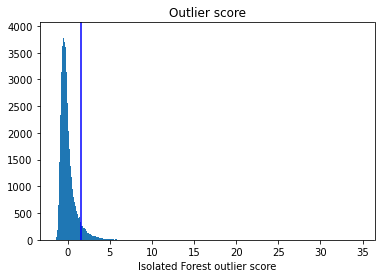

In [18]:
# Combination by average
# The test_scores_norm is 163065 x 5. The "average" function will take the average of the 10 columns. The result "y_train_by_average" is a single column:
y_train_by_average = average(train_scores_norm)

thredhold_upper_avg = uppervalue(y_train_by_average)
plotupper(y_train_by_average, thredhold_upper_avg)

The above chart displays the histogram of the score. We can see that it has a long tail on the right side. The histogram suggests a threshold of 1.51. Scores above 1.51 are far from the central part of the distribution.

Descriptive statistics of the normal and abnormal groups

In [19]:
descriptive_stat_threshold(X_train,y_train_by_average, thredhold_upper_avg)

,Group,Count,Count %,ratio_TP_DRG,ratio_TP_State_DRG,ratio_TP_Region_DRG,ratio_D_DRG,ratio_D_States_DRG,ratio_D_Region_DRG,ratio_MP_DRG,ratio_MP_State_DRG,ratio_MP_Region_DRG,ratio_MTP_City_DRG,Anomaly_Score
0,Normal,152182,93.325974,0.97,0.97,0.98,0.94,0.95,0.95,0.96,0.98,0.98,0.96,-0.19
1,Outlier,10883,6.674026,1.46,1.38,1.29,1.88,1.66,1.66,1.50,1.30,1.30,1.51,2.71


Summary:
The Anomaly Score with all 4 aggregation methods have slight differences in descriptive statistics of the normal and abnormal groups with the base model. Specifically, the top 4 features difference with both models are ratio_D_DRG, ratio_D_States_DRG, ratio_D_Region_DRG, and ratio_MP_DRG. Since the model is sensitive to outliers and can commit overfitting, the aggregation helps to produce a stable prediction outcome. I choose the average prediction of these models as the final model prediction. We could further investigate these observations. 